# Project - COVID-19 Analysis [EDA & Visualization]

- You can find the full project at: https://ourworldindata.org/coronavirus
- Daily-updated dataset link: https://covid.ourworldindata.org/data/owid-covid-data.csv
- Dashboard Example: https://coronavirus.jhu.edu/map.html

### Importing libraries & data


In [1]:
import numpy as np
import pandas as pd 
import matplotlib .pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set()
import plotly.express as px 

In [6]:
df=pd.read_csv('https://covid.ourworldindata.org/data/owid-covid-data.csv')

### EDA 

In [7]:
df.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-01-03,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-01-04,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-01-05,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-01-06,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-01-07,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN


In [8]:
df.tail()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
358641,ZWE,Africa,Zimbabwe,2023-11-18,265890.0,0.0,0.0,5725.0,0.0,0.0,...,30.7,36.791,1.7,61.49,0.571,16320539.0,NaN,NaN,NaN,NaN
358642,ZWE,Africa,Zimbabwe,2023-11-19,265890.0,0.0,0.0,5725.0,0.0,0.0,...,30.7,36.791,1.7,61.49,0.571,16320539.0,NaN,NaN,NaN,NaN
358643,ZWE,Africa,Zimbabwe,2023-11-20,265890.0,0.0,0.0,5725.0,0.0,0.0,...,30.7,36.791,1.7,61.49,0.571,16320539.0,NaN,NaN,NaN,NaN
358644,ZWE,Africa,Zimbabwe,2023-11-21,265890.0,0.0,0.0,5725.0,0.0,0.0,...,30.7,36.791,1.7,61.49,0.571,16320539.0,NaN,NaN,NaN,NaN
358645,ZWE,Africa,Zimbabwe,2023-11-22,265890.0,0.0,0.0,5725.0,0.0,0.0,...,30.7,36.791,1.7,61.49,0.571,16320539.0,NaN,NaN,NaN,NaN


In [9]:
df.columns

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'total_tests', 'new_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'new_vaccinations', 'new_vaccinations_smoothed',
       't

In [10]:
df.shape

(358646, 67)

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 358646 entries, 0 to 358645
Data columns (total 67 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   iso_code                                    358646 non-null  object 
 1   continent                                   341606 non-null  object 
 2   location                                    358646 non-null  object 
 3   date                                        358646 non-null  object 
 4   total_cases                                 320628 non-null  float64
 5   new_cases                                   349032 non-null  float64
 6   new_cases_smoothed                          347773 non-null  float64
 7   total_deaths                                299086 non-null  float64
 8   new_deaths                                  349089 non-null  float64
 9   new_deaths_smoothed                         347859 non-null  float64
 

In [12]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
total_cases,320628.0,6.862419e+06,4.155251e+07,1.0000,8355.000000,7.271900e+04,7.844830e+05,7.721658e+08
new_cases,349032.0,9.375506e+03,1.089256e+05,0.0000,0.000000,1.000000e+00,2.440000e+02,8.401963e+06
new_cases_smoothed,347773.0,9.409256e+03,9.331850e+04,0.0000,0.143000,2.285700e+01,4.737140e+02,6.402036e+06
total_deaths,299086.0,8.695437e+04,4.439683e+05,1.0000,129.000000,1.349000e+03,1.201900e+04,6.981250e+06
new_deaths,349089.0,8.351554e+01,6.290777e+02,0.0000,0.000000,0.000000e+00,2.000000e+00,5.788900e+04
...,...,...,...,...,...,...,...,...
population,358646.0,1.282212e+08,6.599107e+08,47.0000,449002.000000,5.882259e+06,2.830170e+07,7.975105e+09
excess_mortality_cumulative_absolute,12211.0,5.312168e+04,1.494480e+05,-37726.0980,121.649992,5.968999e+03,3.770731e+04,1.289776e+06
excess_mortality_cumulative,12211.0,9.760347e+00,1.229389e+01,-44.2300,1.430000,8.100000e+00,1.538000e+01,7.662000e+01
excess_mortality,12211.0,1.133770e+01,2.516691e+01,-95.9200,-1.590000,5.720000e+00,1.630000e+01,3.776300e+02


In [13]:
df.dtypes

iso_code                                    object
continent                                   object
location                                    object
date                                        object
total_cases                                float64
                                            ...   
population                                 float64
excess_mortality_cumulative_absolute       float64
excess_mortality_cumulative                float64
excess_mortality                           float64
excess_mortality_cumulative_per_million    float64
Length: 67, dtype: object

### EXPlORING WORLD DATA 

In [14]:
df['location'].unique()

array(['Afghanistan', 'Africa', 'Albania', 'Algeria', 'American Samoa',
       'Andorra', 'Angola', 'Anguilla', 'Antigua and Barbuda',
       'Argentina', 'Armenia', 'Aruba', 'Asia', 'Australia', 'Austria',
       'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados',
       'Belarus', 'Belgium', 'Belize', 'Benin', 'Bermuda', 'Bhutan',
       'Bolivia', 'Bonaire Sint Eustatius and Saba',
       'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'British Virgin Islands', 'Brunei', 'Bulgaria', 'Burkina Faso',
       'Burundi', 'Cambodia', 'Cameroon', 'Canada', 'Cape Verde',
       'Cayman Islands', 'Central African Republic', 'Chad', 'Chile',
       'China', 'Colombia', 'Comoros', 'Congo', 'Cook Islands',
       'Costa Rica', "Cote d'Ivoire", 'Croatia', 'Cuba', 'Curacao',
       'Cyprus', 'Czechia', 'Democratic Republic of Congo', 'Denmark',
       'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'England', 'Equatorial Guinea', 'Eritrea',

In [15]:
df['location'].nunique()

255

In [16]:
df_world=df[df['location']=='World']
df_world.reset_index()

,index,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,352966,OWID_WRL,NaN,World,2020-01-03,NaN,0.0,NaN,NaN,0.0,...,34.635,60.13,2.705,72.58,0.737,7.975105e+09,NaN,NaN,NaN,NaN
1,352967,OWID_WRL,NaN,World,2020-01-04,3.0,3.0,NaN,NaN,0.0,...,34.635,60.13,2.705,72.58,0.737,7.975105e+09,NaN,NaN,NaN,NaN
2,352968,OWID_WRL,NaN,World,2020-01-05,2.0,0.0,NaN,3.0,3.0,...,34.635,60.13,2.705,72.58,0.737,7.975105e+09,NaN,NaN,NaN,NaN
3,352969,OWID_WRL,NaN,World,2020-01-06,5.0,3.0,NaN,3.0,0.0,...,34.635,60.13,2.705,72.58,0.737,7.975105e+09,NaN,NaN,NaN,NaN
4,352970,OWID_WRL,NaN,World,2020-01-07,5.0,0.0,NaN,3.0,0.0,...,34.635,60.13,2.705,72.58,0.737,7.975105e+09,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1415,354381,OWID_WRL,NaN,World,2023-11-18,772164882.0,2748.0,19522.429,6981218.0,15.0,...,34.635,60.13,2.705,72.58,0.737,7.975105e+09,NaN,NaN,NaN,NaN
1416,354382,OWID_WRL,NaN,World,2023-11-19,772165753.0,871.0,18297.429,6981250.0,32.0,...,34.635,60.13,2.705,72.58,0.737,7.975105e+09,NaN,NaN,NaN,NaN
1417,354383,OWID_WRL,NaN,World,2023-11-20,772165753.0,0.0,12107.143,6981250.0,0.0,...,34.635,60.13,2.705,72.58,0.737,7.975105e+09,NaN,NaN,NaN,NaN
1418,354384,OWID_WRL,NaN,World,2023-11-21,772165753.0,0.0,4359.000,6981250.0,0.0,...,34.635,60.13,2.705,72.58,0.737,7.975105e+09,NaN,NaN,NaN,NaN


The date of the maximum number of the deaths all over the world ?

In [17]:
df_world .head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
352966,OWID_WRL,NaN,World,2020-01-03,NaN,0.0,NaN,NaN,0.0,NaN,...,34.635,60.13,2.705,72.58,0.737,7.975105e+09,NaN,NaN,NaN,NaN
352967,OWID_WRL,NaN,World,2020-01-04,3.0,3.0,NaN,NaN,0.0,NaN,...,34.635,60.13,2.705,72.58,0.737,7.975105e+09,NaN,NaN,NaN,NaN
352968,OWID_WRL,NaN,World,2020-01-05,2.0,0.0,NaN,3.0,3.0,NaN,...,34.635,60.13,2.705,72.58,0.737,7.975105e+09,NaN,NaN,NaN,NaN
352969,OWID_WRL,NaN,World,2020-01-06,5.0,3.0,NaN,3.0,0.0,NaN,...,34.635,60.13,2.705,72.58,0.737,7.975105e+09,NaN,NaN,NaN,NaN
352970,OWID_WRL,NaN,World,2020-01-07,5.0,0.0,NaN,3.0,0.0,NaN,...,34.635,60.13,2.705,72.58,0.737,7.975105e+09,NaN,NaN,NaN,NaN


In [18]:
df_world[df_world['new_deaths']==df_world['new_deaths'].max()]

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
354091,OWID_WRL,NaN,World,2023-02-01,752663406.0,176142.0,208955.857,6839545.0,57889.0,9392.429,...,34.635,60.13,2.705,72.58,0.737,7.975105e+09,NaN,NaN,NaN,NaN


In [19]:
df_world[df_world['new_deaths']==df_world['new_deaths'].max()]['date']


354091    2023-02-01
Name: date, dtype: object

In [20]:
px.line(df_world,y='new_deaths',x='date')

In [21]:
df[(df['date']=='2023-02-01')&(df['location']=='China')]

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
63607,CHN,Asia,China,2023-02-01,98527660.0,55271.0,24618.286,113926.0,44047.0,6292.429,...,48.4,NaN,4.34,76.91,0.761,1.425887e+09,NaN,NaN,NaN,NaN


### calculating the percentage of confirmed cases regarding the world population 

In [22]:
df_world['total_cases'].max()

772165753.0

In [23]:
df_world['population'].max()

7975105024.0

In [24]:
df_world_ratio=df_world['total_cases'].max() / df_world['population'].max()
df_world_ratio

0.09682201684821348

In [25]:
print('{:.2f}'.format(df_world_ratio))

0.10


## data Visualization

### Confirmed cases (Total Cases) all over the world

In [26]:
df.head(2)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-01-03,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-01-04,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN


In [27]:
df_world_overtime=df_world.groupby('date')[['total_cases','new_cases','total_deaths','new_deaths']].sum().reset_index()
df_world_overtime

,date,total_cases,new_cases,total_deaths,new_deaths
0,2020-01-03,0.0,0.0,0.0,0.0
1,2020-01-04,3.0,3.0,0.0,0.0
2,2020-01-05,2.0,0.0,3.0,3.0
3,2020-01-06,5.0,3.0,3.0,0.0
4,2020-01-07,5.0,0.0,3.0,0.0
...,...,...,...,...,...
1415,2023-11-18,772164882.0,2748.0,6981218.0,15.0
1416,2023-11-19,772165753.0,871.0,6981250.0,32.0
1417,2023-11-20,772165753.0,0.0,6981250.0,0.0
1418,2023-11-21,772165753.0,0.0,6981250.0,0.0


In [28]:
df_world_overtime['date']=pd.to_datetime(df_world_overtime['date'])

In [29]:
px.line(df_world_overtime,x='date',y='total_cases')

### the distribution of vaccination coverage over time

In [30]:

px.line(df_world,x='date', y='total_vaccinations',)

###  the relationship between total cases and total vaccinations

In [31]:
px.line(df_world,x='total_cases',y='total_vaccinations')

### Relation Between Total deaths and Total vaccinations 

In [32]:
px.line(df_world,x='total_deaths',y='total_vaccinations')

### Total Deaths Over Time

In [33]:


df_world['date'] = pd.to_datetime(df_world['date'])


fig = px.bar(df_world, x='date', y='total_deaths', title='Total Deaths Over Time',
             labels={'date': 'Date', 'total_deaths': 'Total Deaths'})
fig.show()



C:\Users\ELZAHBIA\AppData\Local\Temp\ipykernel_21564\3752389271.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [34]:
df.columns

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'total_tests', 'new_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'new_vaccinations', 'new_vaccinations_smoothed',
       't

### relation between the continent and the total deaths

In [35]:
df1 = df.sample(frac = 0.5, replace=True, random_state=42)

In [40]:
px.histogram(df1,x='continent',y='total_deaths')

### relation between people_fully_vaccinated and the total deaths

In [54]:
df2=df_world.groupby('people_fully_vaccinated')['total_deaths'].sum().reset_index()

In [70]:
px.line(df2,y='people_fully_vaccinated',x='total_deaths')

# Exploring Egypt data 

In [72]:
df.location.unique()

array(['Afghanistan', 'Africa', 'Albania', 'Algeria', 'American Samoa',
       'Andorra', 'Angola', 'Anguilla', 'Antigua and Barbuda',
       'Argentina', 'Armenia', 'Aruba', 'Asia', 'Australia', 'Austria',
       'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados',
       'Belarus', 'Belgium', 'Belize', 'Benin', 'Bermuda', 'Bhutan',
       'Bolivia', 'Bonaire Sint Eustatius and Saba',
       'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'British Virgin Islands', 'Brunei', 'Bulgaria', 'Burkina Faso',
       'Burundi', 'Cambodia', 'Cameroon', 'Canada', 'Cape Verde',
       'Cayman Islands', 'Central African Republic', 'Chad', 'Chile',
       'China', 'Colombia', 'Comoros', 'Congo', 'Cook Islands',
       'Costa Rica', "Cote d'Ivoire", 'Croatia', 'Cuba', 'Curacao',
       'Cyprus', 'Czechia', 'Democratic Republic of Congo', 'Denmark',
       'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'England', 'Equatorial Guinea', 'Eritrea',

In [74]:
df_egypt=df[df['location']=='Egypt']
df_egypt

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
88042,EGY,Africa,Egypt,2020-01-03,NaN,0.0,NaN,NaN,0.0,NaN,...,50.1,89.827,1.6,71.99,0.707,110990096.0,NaN,NaN,NaN,NaN
88043,EGY,Africa,Egypt,2020-01-04,NaN,0.0,NaN,NaN,0.0,NaN,...,50.1,89.827,1.6,71.99,0.707,110990096.0,NaN,NaN,NaN,NaN
88044,EGY,Africa,Egypt,2020-01-05,NaN,0.0,NaN,NaN,0.0,NaN,...,50.1,89.827,1.6,71.99,0.707,110990096.0,NaN,NaN,NaN,NaN
88045,EGY,Africa,Egypt,2020-01-06,NaN,0.0,NaN,NaN,0.0,NaN,...,50.1,89.827,1.6,71.99,0.707,110990096.0,NaN,NaN,NaN,NaN
88046,EGY,Africa,Egypt,2020-01-07,NaN,0.0,NaN,NaN,0.0,NaN,...,50.1,89.827,1.6,71.99,0.707,110990096.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89457,EGY,Africa,Egypt,2023-11-18,516023.0,0.0,0.0,24830.0,0.0,0.0,...,50.1,89.827,1.6,71.99,0.707,110990096.0,NaN,NaN,NaN,NaN
89458,EGY,Africa,Egypt,2023-11-19,516023.0,0.0,0.0,24830.0,0.0,0.0,...,50.1,89.827,1.6,71.99,0.707,110990096.0,NaN,NaN,NaN,NaN
89459,EGY,Africa,Egypt,2023-11-20,516023.0,0.0,0.0,24830.0,0.0,0.0,...,50.1,89.827,1.6,71.99,0.707,110990096.0,NaN,NaN,NaN,NaN
89460,EGY,Africa,Egypt,2023-11-21,516023.0,0.0,0.0,24830.0,0.0,0.0,...,50.1,89.827,1.6,71.99,0.707,110990096.0,NaN,NaN,NaN,NaN


In [80]:
df_egypt.reset_index(drop=True,inplace=True)

In [81]:
df_egypt.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,EGY,Africa,Egypt,2020-01-03,NaN,0.0,NaN,NaN,0.0,NaN,...,50.1,89.827,1.6,71.99,0.707,110990096.0,NaN,NaN,NaN,NaN
1,EGY,Africa,Egypt,2020-01-04,NaN,0.0,NaN,NaN,0.0,NaN,...,50.1,89.827,1.6,71.99,0.707,110990096.0,NaN,NaN,NaN,NaN
2,EGY,Africa,Egypt,2020-01-05,NaN,0.0,NaN,NaN,0.0,NaN,...,50.1,89.827,1.6,71.99,0.707,110990096.0,NaN,NaN,NaN,NaN
3,EGY,Africa,Egypt,2020-01-06,NaN,0.0,NaN,NaN,0.0,NaN,...,50.1,89.827,1.6,71.99,0.707,110990096.0,NaN,NaN,NaN,NaN
4,EGY,Africa,Egypt,2020-01-07,NaN,0.0,NaN,NaN,0.0,NaN,...,50.1,89.827,1.6,71.99,0.707,110990096.0,NaN,NaN,NaN,NaN


In [84]:
df_egypt.columns

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'total_tests', 'new_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'new_vaccinations', 'new_vaccinations_smoothed',
       't

In [171]:
df_egypt1=df_egypt[['total_deaths','date','new_deaths','total_cases','new_cases','people_vaccinated','people_fully_vaccinated'
                   ,'median_age','aged_65_older','female_smokers','male_smokers','hospital_beds_per_thousand']]
df_egypt1

,total_deaths,date,new_deaths,total_cases,new_cases,people_vaccinated,people_fully_vaccinated,median_age,aged_65_older,female_smokers,male_smokers,hospital_beds_per_thousand
337567,NaN,2020-01-03,0.0,NaN,0.0,NaN,NaN,38.3,15.413,19.1,24.6,2.77
337568,NaN,2020-01-04,0.0,NaN,0.0,NaN,NaN,38.3,15.413,19.1,24.6,2.77
337569,NaN,2020-01-05,0.0,NaN,0.0,NaN,NaN,38.3,15.413,19.1,24.6,2.77
337570,NaN,2020-01-06,0.0,NaN,0.0,NaN,NaN,38.3,15.413,19.1,24.6,2.77
337571,NaN,2020-01-07,0.0,NaN,0.0,NaN,NaN,38.3,15.413,19.1,24.6,2.77
...,...,...,...,...,...,...,...,...,...,...,...,...
338982,1138309.0,2023-11-18,NaN,103436829.0,NaN,NaN,NaN,38.3,15.413,19.1,24.6,2.77
338983,1138309.0,2023-11-19,NaN,103436829.0,NaN,NaN,NaN,38.3,15.413,19.1,24.6,2.77
338984,1138309.0,2023-11-20,NaN,103436829.0,NaN,NaN,NaN,38.3,15.413,19.1,24.6,2.77
338985,1138309.0,2023-11-21,NaN,103436829.0,NaN,NaN,NaN,38.3,15.413,19.1,24.6,2.77


## cleaning data and handling missing value

In [172]:
df_egypt1['date'] = pd.to_datetime(df_egypt1['date'])

C:\Users\ELZAHBIA\AppData\Local\Temp\ipykernel_21564\2121473774.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [173]:
df_egypt1.shape

(1420, 12)

In [174]:
df.duplicated().sum()

0

In [175]:
df_egypt1.isnull().sum()

total_deaths                   57
date                            0
new_deaths                    187
total_cases                    17
new_cases                     186
people_vaccinated             542
people_fully_vaccinated       542
median_age                      0
aged_65_older                   0
female_smokers                  0
male_smokers                    0
hospital_beds_per_thousand      0
dtype: int64

In [176]:
df_egypt1.isnull().sum() / df_egypt1 .shape[0]*100

total_deaths                   4.014085
date                           0.000000
new_deaths                    13.169014
total_cases                    1.197183
new_cases                     13.098592
people_vaccinated             38.169014
people_fully_vaccinated       38.169014
median_age                     0.000000
aged_65_older                  0.000000
female_smokers                 0.000000
male_smokers                   0.000000
hospital_beds_per_thousand     0.000000
dtype: float64

<Axes: >

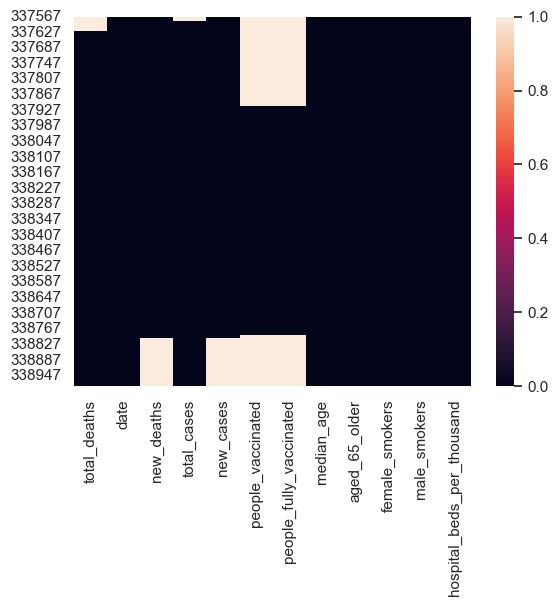

In [177]:
sns.heatmap(df_egypt1.isna())

#### we should to drop  the people_vaccinated  and  people_fully_vaccinated   

In [178]:
df_egypt1.loc[:, ['people_fully_vaccinated', 'people_vaccinated']] = df_egypt1.loc[:, ['people_fully_vaccinated', 'people_vaccinated']].dropna()

C:\Users\ELZAHBIA\AppData\Local\Temp\ipykernel_21564\1139313174.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [180]:
df_egypt1

,total_deaths,date,new_deaths,total_cases,new_cases,people_vaccinated,people_fully_vaccinated,median_age,aged_65_older,female_smokers,male_smokers,hospital_beds_per_thousand
337567,NaN,2020-01-03,0.0,NaN,0.0,NaN,NaN,38.3,15.413,19.1,24.6,2.77
337568,NaN,2020-01-04,0.0,NaN,0.0,NaN,NaN,38.3,15.413,19.1,24.6,2.77
337569,NaN,2020-01-05,0.0,NaN,0.0,NaN,NaN,38.3,15.413,19.1,24.6,2.77
337570,NaN,2020-01-06,0.0,NaN,0.0,NaN,NaN,38.3,15.413,19.1,24.6,2.77
337571,NaN,2020-01-07,0.0,NaN,0.0,NaN,NaN,38.3,15.413,19.1,24.6,2.77
...,...,...,...,...,...,...,...,...,...,...,...,...
338982,1138309.0,2023-11-18,NaN,103436829.0,NaN,NaN,NaN,38.3,15.413,19.1,24.6,2.77
338983,1138309.0,2023-11-19,NaN,103436829.0,NaN,NaN,NaN,38.3,15.413,19.1,24.6,2.77
338984,1138309.0,2023-11-20,NaN,103436829.0,NaN,NaN,NaN,38.3,15.413,19.1,24.6,2.77
338985,1138309.0,2023-11-21,NaN,103436829.0,NaN,NaN,NaN,38.3,15.413,19.1,24.6,2.77


In [181]:
df_egypt1.isna().sum() / df.shape[0]*100

total_deaths                  0.015893
date                          0.000000
new_deaths                    0.052141
total_cases                   0.004740
new_cases                     0.051862
people_vaccinated             0.151124
people_fully_vaccinated       0.151124
median_age                    0.000000
aged_65_older                 0.000000
female_smokers                0.000000
male_smokers                  0.000000
hospital_beds_per_thousand    0.000000
dtype: float64

In [182]:
df_egypt1['total_deaths']=df['total_deaths'].fillna(round(df_egypt1['total_deaths'].median(),2))

C:\Users\ELZAHBIA\AppData\Local\Temp\ipykernel_21564\360758479.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [183]:
df_egypt1['total_cases']=df['total_cases'].fillna(round(df_egypt1['total_cases'].median(),2))

C:\Users\ELZAHBIA\AppData\Local\Temp\ipykernel_21564\2320238711.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [184]:
df_egypt1['people_vaccinated']=df['people_vaccinated'].fillna(round(df_egypt1['people_vaccinated'].median(),2))

C:\Users\ELZAHBIA\AppData\Local\Temp\ipykernel_21564\1814532723.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [185]:
df_egypt1['people_vaccinated']=df['people_vaccinated'].fillna(round(df_egypt1['people_vaccinated'].median(),2))

C:\Users\ELZAHBIA\AppData\Local\Temp\ipykernel_21564\1814532723.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [186]:
df_egypt1['people_fully_vaccinated']=df['people_fully_vaccinated'].fillna(round(df_egypt1['people_fully_vaccinated'].median(),2))

C:\Users\ELZAHBIA\AppData\Local\Temp\ipykernel_21564\3280125749.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [191]:
df_egypt1['new_cases']=df['new_cases'].fillna(round(df_egypt1['new_cases'].median(),2))

C:\Users\ELZAHBIA\AppData\Local\Temp\ipykernel_21564\2435501790.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [192]:
df_egypt1['new_deaths']=df['new_deaths'].fillna(round(df_egypt1['new_deaths'].median(),2))

C:\Users\ELZAHBIA\AppData\Local\Temp\ipykernel_21564\2168022477.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [193]:
df_egypt1.isna().sum() / df.shape[0]*100

total_deaths                  0.0
date                          0.0
new_deaths                    0.0
total_cases                   0.0
new_cases                     0.0
people_vaccinated             0.0
people_fully_vaccinated       0.0
median_age                    0.0
aged_65_older                 0.0
female_smokers                0.0
male_smokers                  0.0
hospital_beds_per_thousand    0.0
dtype: float64